# Seurat clustering of Set 3 (10X, CAP)

In [1]:
# load packages
library(ggplot2)
library(magrittr)
library(data.table)
library(Seurat)
# library(DropletUtils)
library(Matrix)
library(dplyr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
count.table <- read.csv(file = '../../data/original_data/Set3/umi_count_table_HQC_Set3.csv')
head(count.table)
dim(count.table)

,AAACCCAAGCAACAAT,AAACCCAAGCGATCGA,AAACCCACAGGGAGAG,AAACCCAGTCATAGTC,AAACCCATCCACGGGT,AAACCCATCCAGTGCG,AAACCCATCCGGACTG,AAACGAAAGACATAGT,AAACGAAAGGAACGAA,AAACGAACACATACTG,⋯,TTTGGTTCAGATCCAT,TTTGGTTCAGGGAGAG,TTTGGTTCAGTCAACT,TTTGGTTTCCGTACGG,TTTGGTTTCGTCCATC,TTTGGTTTCTGGCTGG,TTTGTTGCAGGCATTT,TTTGTTGGTCTCACGG,TTTGTTGGTGCCCGTA,TTTGTTGTCCACCTCA
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
Myo81F,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CR41571,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CR12798,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
lncRNA:CR46123,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
lncRNA:CR46122,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CR40182,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


[1] 17506  6289

In [3]:
seu_HQC <- CreateSeuratObject(count.table) 
seu_HQC

An object of class Seurat 
17506 features across 6289 samples within 1 assay 
Active assay: RNA (17506 features, 0 variable features)

In [4]:
is.mt <- grepl(pattern = '^mt:', x = row.names(seu_HQC))
is.rRNA <- grepl(pattern = 'rRNA', x = row.names(seu_HQC))
is.rRNA <- is.rRNA & (!is.mt)
mt.list <- row.names(seu_HQC)[is.mt]
rRNA.list <- row.names(seu_HQC)[is.rRNA]

In [5]:
head(rRNA.list)

[1] "5SrRNA:CR33452" "5SrRNA:CR33451" "5SrRNA:CR33450" "5SrRNA:CR33449"
[5] "5SrRNA:CR33448" "5SrRNA:CR33447"

In [6]:
seu_HQC[["percent.mt"]] <- PercentageFeatureSet(seu_HQC, pattern = "^mt:")
seu_HQC[["percent.rRNA"]] <- PercentageFeatureSet(seu_HQC, features = rRNA.list)

In [7]:
summary(seu_HQC$percent.mt)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  6.058  13.974  15.815  16.339  18.327  27.420 

In [8]:
summary(seu_HQC$percent.rRNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.259   1.482   1.818   2.029   2.355   5.076 

## Normalize, DR and Clustering

In [9]:
seu_HQC <- suppressWarnings(SCTransform(seu_HQC, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE)) 

In [10]:
vf.info <- HVFInfo(seu_HQC)
argsort.var <- order(vf.info$residual_variance, decreasing = T)
vf.info.sorted <- vf.info[argsort.var,]
head(vf.info.sorted)
dim(vf.info.sorted)

,gmean,variance,residual_variance
,<dbl>,<dbl>,<dbl>
sog,5.4075999,2963.6802,300.2567
peb,0.6518347,181.0086,170.3638
CG13653,0.3306915,130.2105,168.1911
Abd-B,0.6201138,171.9160,141.5854
E(spl)m7-HLH,1.0249837,229.6959,123.4889
pgc,0.2230408,339.0804,121.3976


[1] 11257     3

If a gene has residual variance = 1, this variance is thought to be derived from noizes and the expression of the gene is expected not to vary among cell types. Therefore, we define residual variance -1 as "biological variance".

pdf 
  2

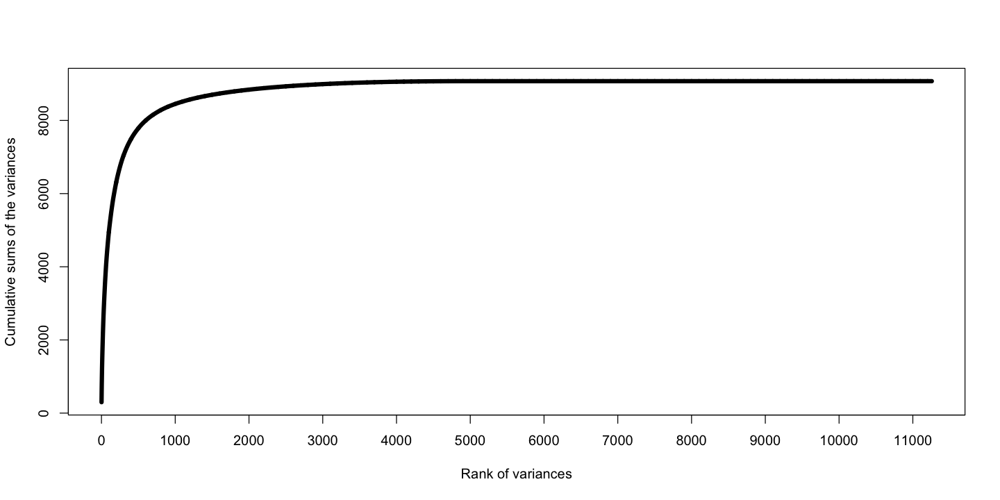

In [11]:
var.bio <- vf.info.sorted$residual_variance - 1
var.bio[var.bio<0] <- 0
# var.ratio.bio <- var.bio/sum(var.bio)
options(repr.plot.width=12, repr.plot.height=6)
plot(1:length(var.bio),cumsum(var.bio),xaxp =c(0,12000,12),type = 'l',lwd = '5',
     xlab = 'Rank of variances', ylab = 'Cumulative sums of the variances')
postscript("./figures/01_Seurat_clustering_Set3/VFs_variance.eps", width = 12, height = 6, pointsize = 6, horizontal = FALSE)
plot(1:length(var.bio),cumsum(var.bio),xaxp =c(0,12000,12),type = 'l',lwd = '5',
     xlab = 'Rank of variances', ylab = 'Cumulative sums of the variances')
dev.off()

Using 3,000 genes for downstream analysis

In [12]:
seu_HQC <- RunPCA(seu_HQC, verbose = FALSE)

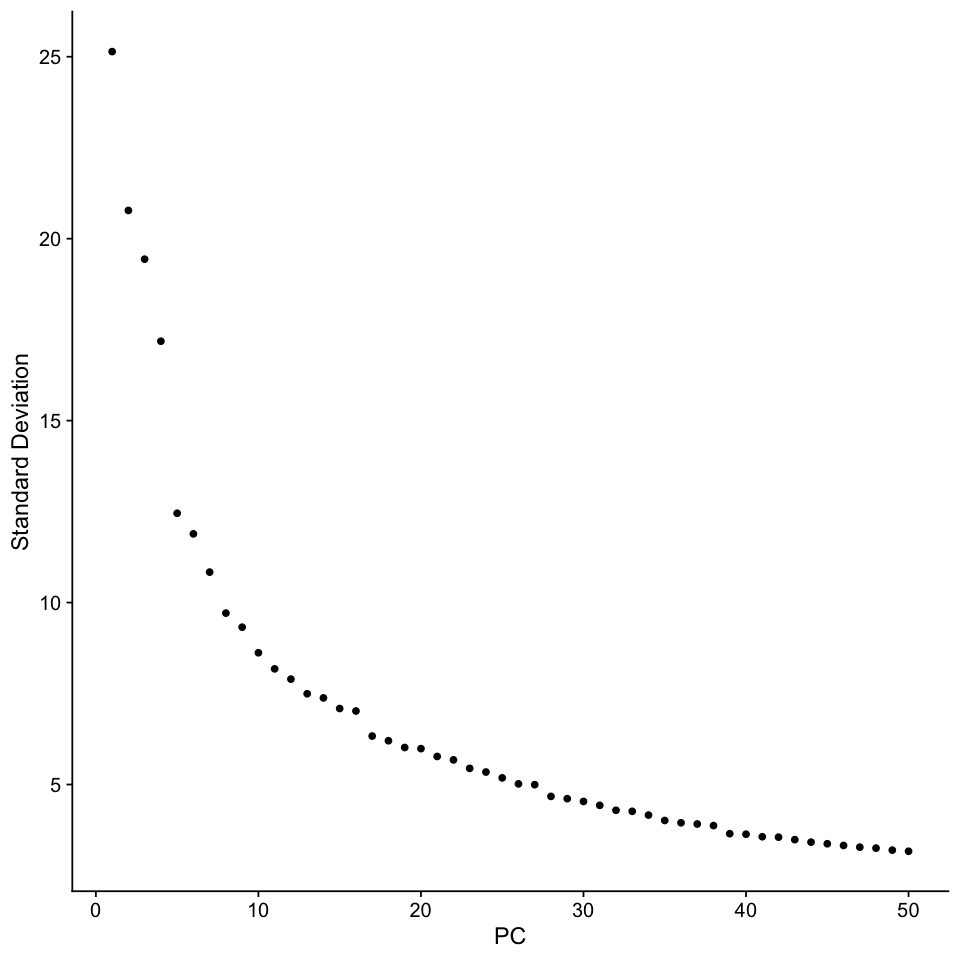

In [13]:
# VariableFeaturePlot(seu_HQC)
options(repr.plot.width=8, repr.plot.height=8)
p <- ElbowPlot(seu_HQC, ndims = 50)
p
ggsave(p, file = './figures/01_Seurat_clustering_Set3/elbowplot_of_PCs.eps', dpi = 300, width = 8, height = 8)

Using 30 PCs for downstream analysis

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


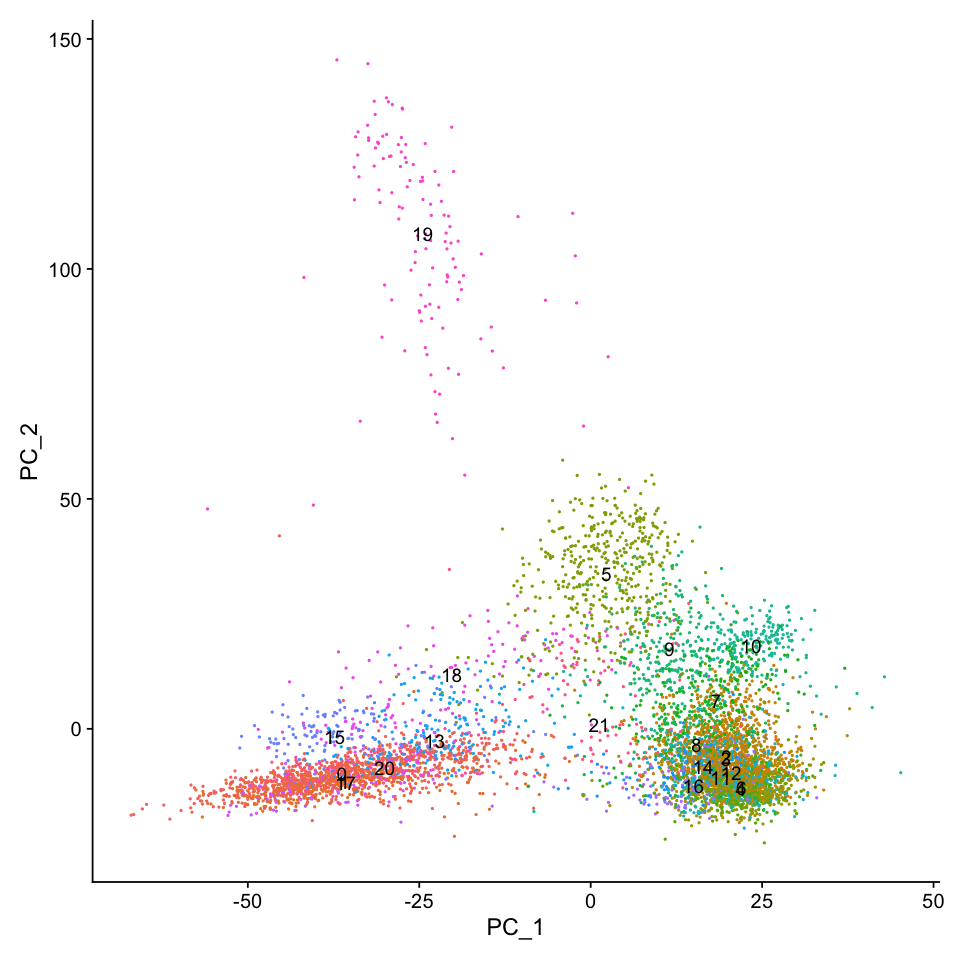

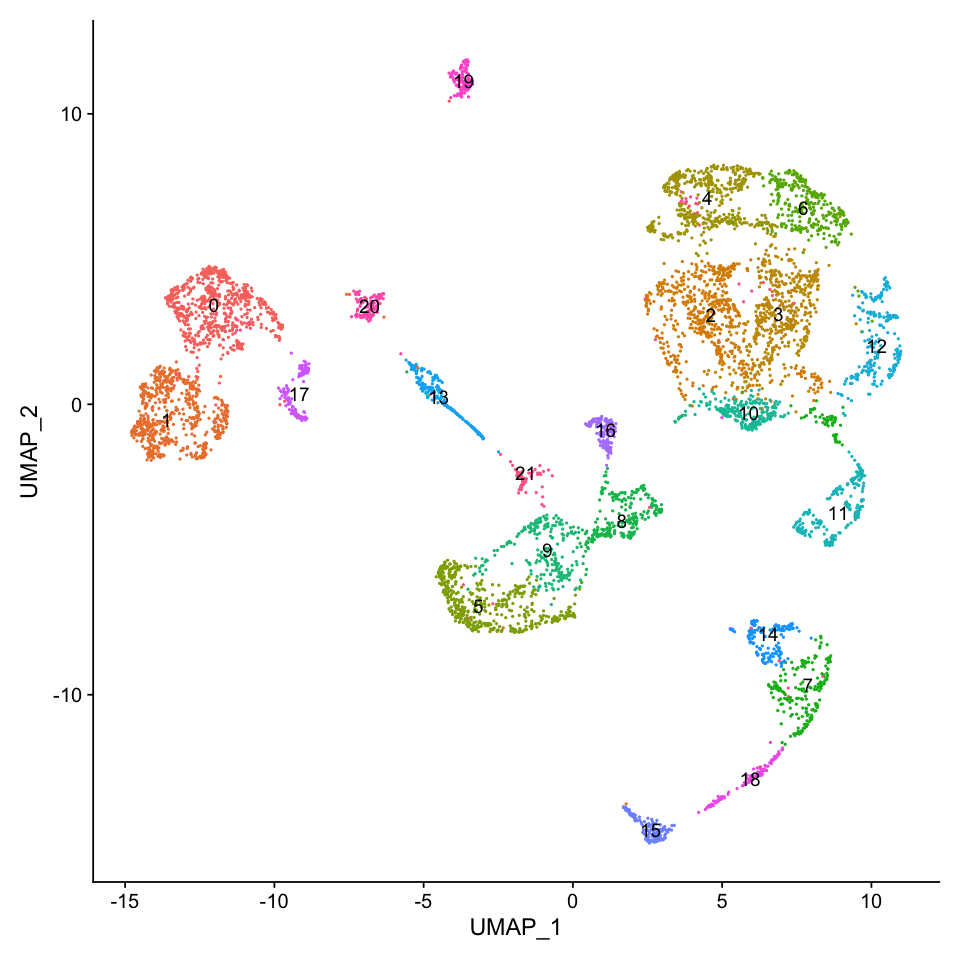

In [14]:
# seu_HQC <- RunTSNE(seu_HQC, dims = 1:30, verbose = FALSE)
seu_HQC <- RunUMAP(seu_HQC, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC <- FindNeighbors(seu_HQC, dims = 1:30, verbose = FALSE)
seu_HQC <- FindClusters(seu_HQC, verbose = FALSE)
DimPlot(seu_HQC, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC, reduction =  "umap", label = TRUE) + NoLegend()

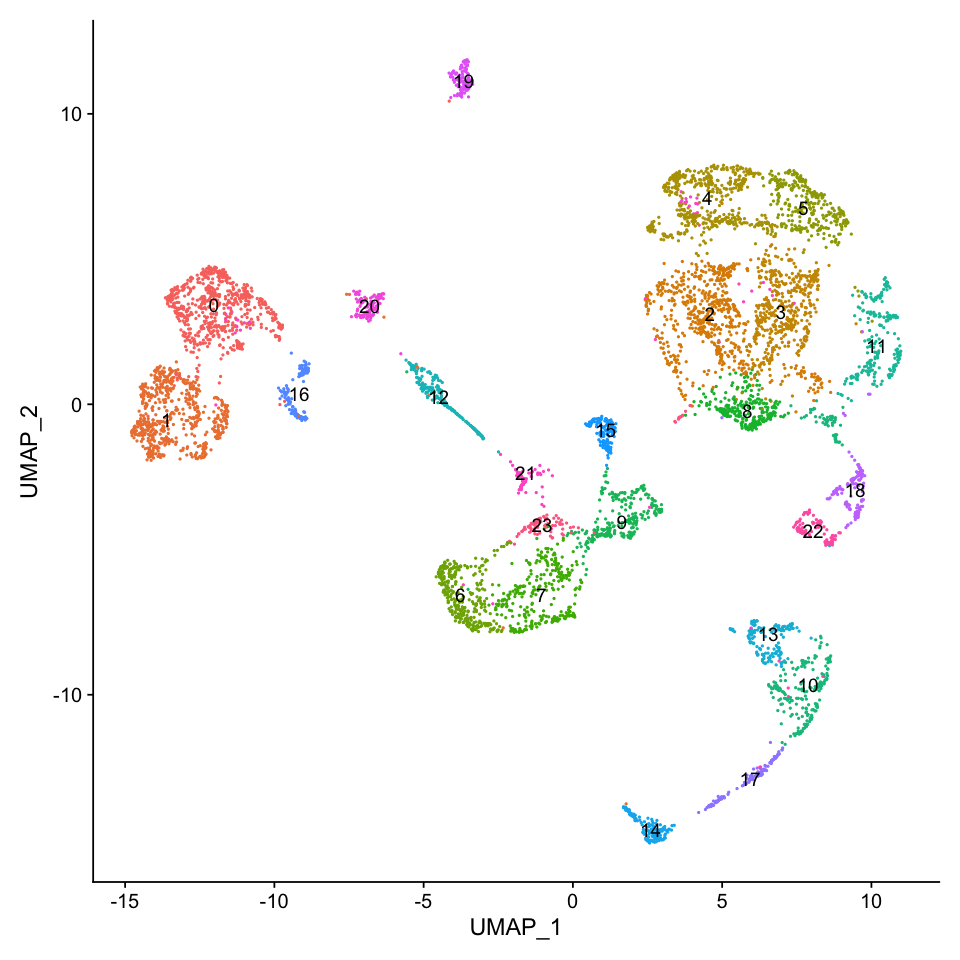

In [15]:
seu_HQC <- FindClusters(seu_HQC, verbose = FALSE, resolution = 1)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE) + NoLegend()

In [16]:
# VF_top10 <- head(VariableFeatures(seu_HQC), 10)
# VF_top10

UMAP plot (tsneは消す)

In [17]:
# options(repr.plot.width=16, repr.plot.height=16)
# FeaturePlot(seu_HQC, reduction = "tsne", features = c("nCount_RNA", "nFeature_RNA", 
#                                "percent.mt", "percent.rRNA"), pt.size = 0.2,  ncol = 2)

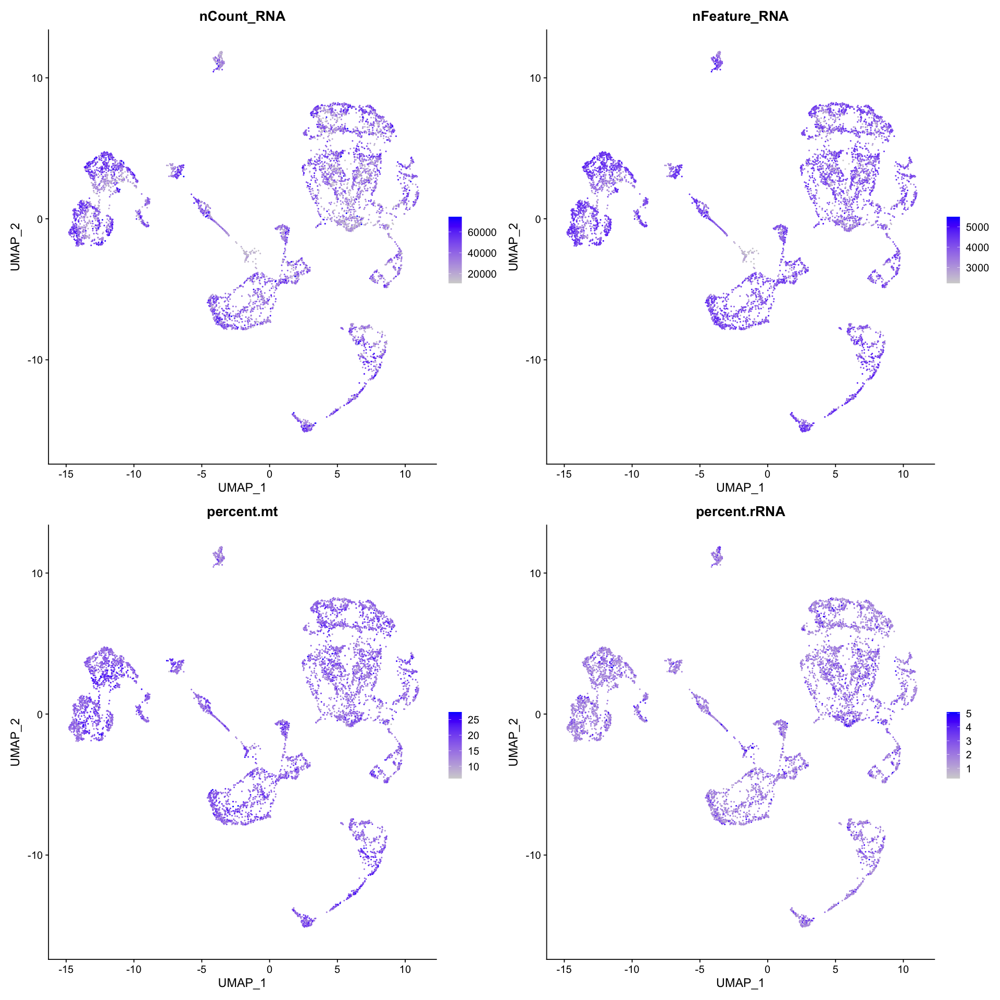

In [18]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("nCount_RNA", "nFeature_RNA", 
                               "percent.mt", "percent.rRNA"), pt.size = 0.2,  ncol = 2)

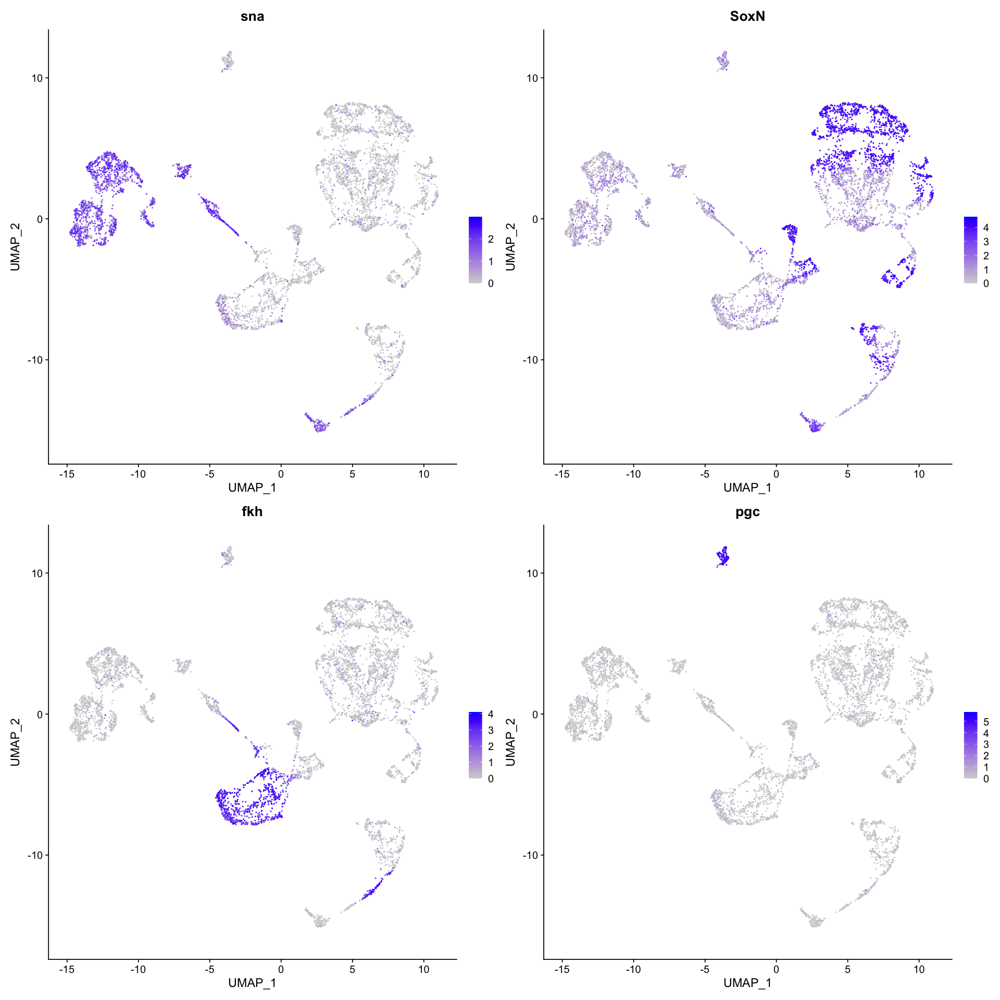

In [19]:
#Major marker genes of each germ layer
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("sna","SoxN", "fkh", "pgc"), pt.size = 0.2,  ncol = 2)

In [20]:
all.markers <- FindAllMarkers(object = seu_HQC, only.pos = TRUE)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23



In [21]:
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Warning message in DoHeatmap(seu_HQC, features = all.markers.top10$gene):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: RpS12, RpL37A”


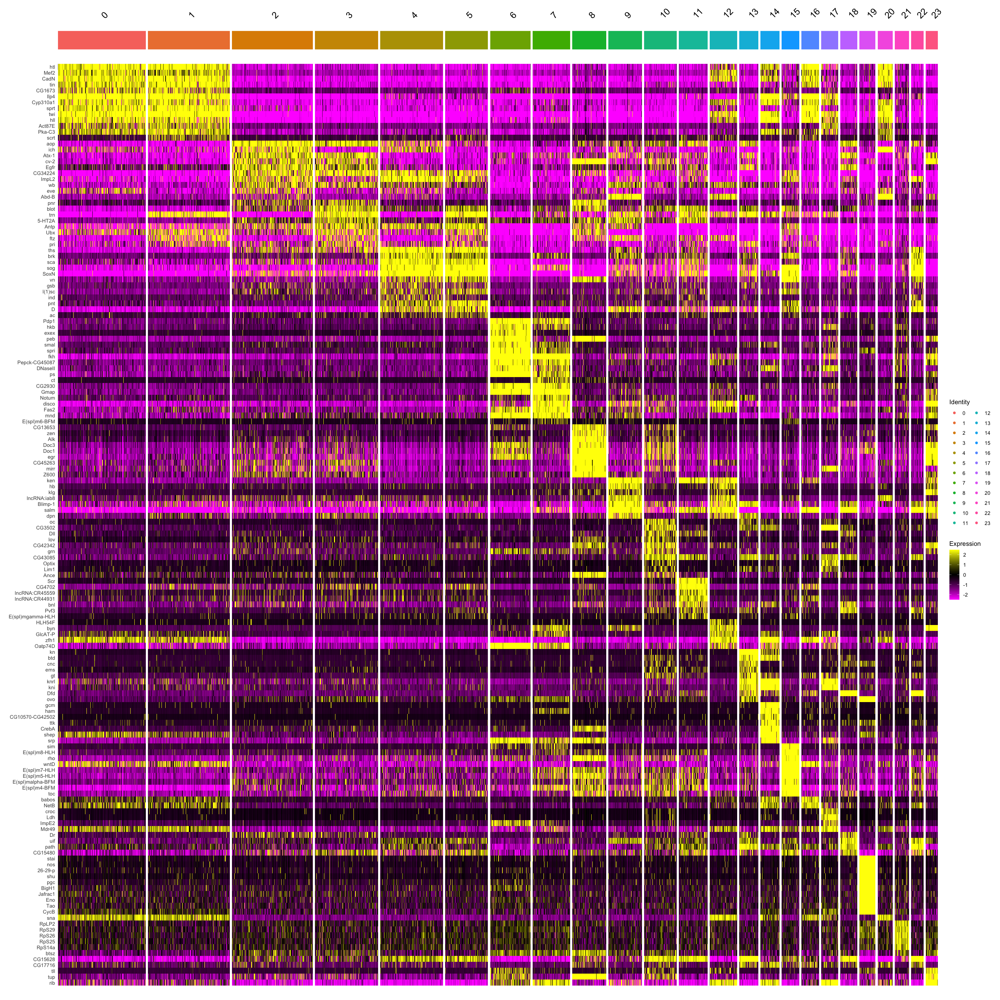

In [22]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu_HQC, features = all.markers.top10$gene)

Top markers of cluster 21 were Ribosomal proteins

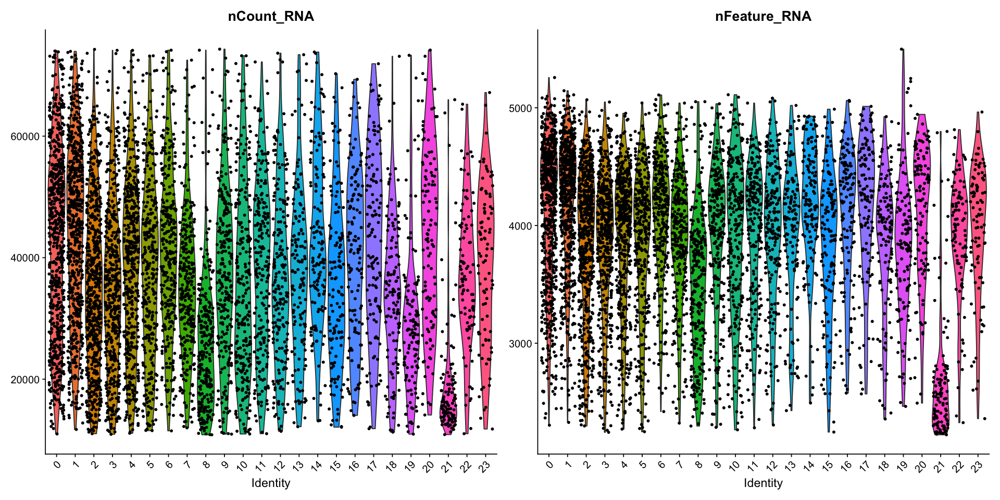

In [23]:
options(repr.plot.width=16, repr.plot.height=8)
VlnPlot(seu_HQC, features = c('nCount_RNA','nFeature_RNA'))

Cluster 21 shows small total UMI count and number of detected genes

In [24]:
clust21 <- subset(seu_HQC, ident = c("21"))
clust21

An object of class Seurat 
28763 features across 109 samples within 2 assays 
Active assay: SCT (11257 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [25]:
# remove cluster21(109 cells) as low quality cells
# seu_HQC2 <- subset(seu_HQC, ident = c("0", "1", "2", "3", "4", "5", "6", "7", "8", "9", "10", 
#                                      "11", "12", "13", "14", "15", "16", "17", "18", "19", "20", "22", "23"))
seu_HQC2 <- subset(seu_HQC, ident = c("21"), invert = T)
seu_HQC2

An object of class Seurat 
28763 features across 6180 samples within 2 assays 
Active assay: SCT (11257 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [26]:
# re-normalize
DefaultAssay(seu_HQC2) <- "RNA"
seu_HQC2

An object of class Seurat 
28763 features across 6180 samples within 2 assays 
Active assay: RNA (17506 features, 0 variable features)
 1 other assay present: SCT
 2 dimensional reductions calculated: pca, umap

In [27]:
seu_HQC2 <- suppressWarnings(SCTransform(seu_HQC2, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

In [28]:
seu_HQC2

An object of class Seurat 
28756 features across 6180 samples within 2 assays 
Active assay: SCT (11250 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

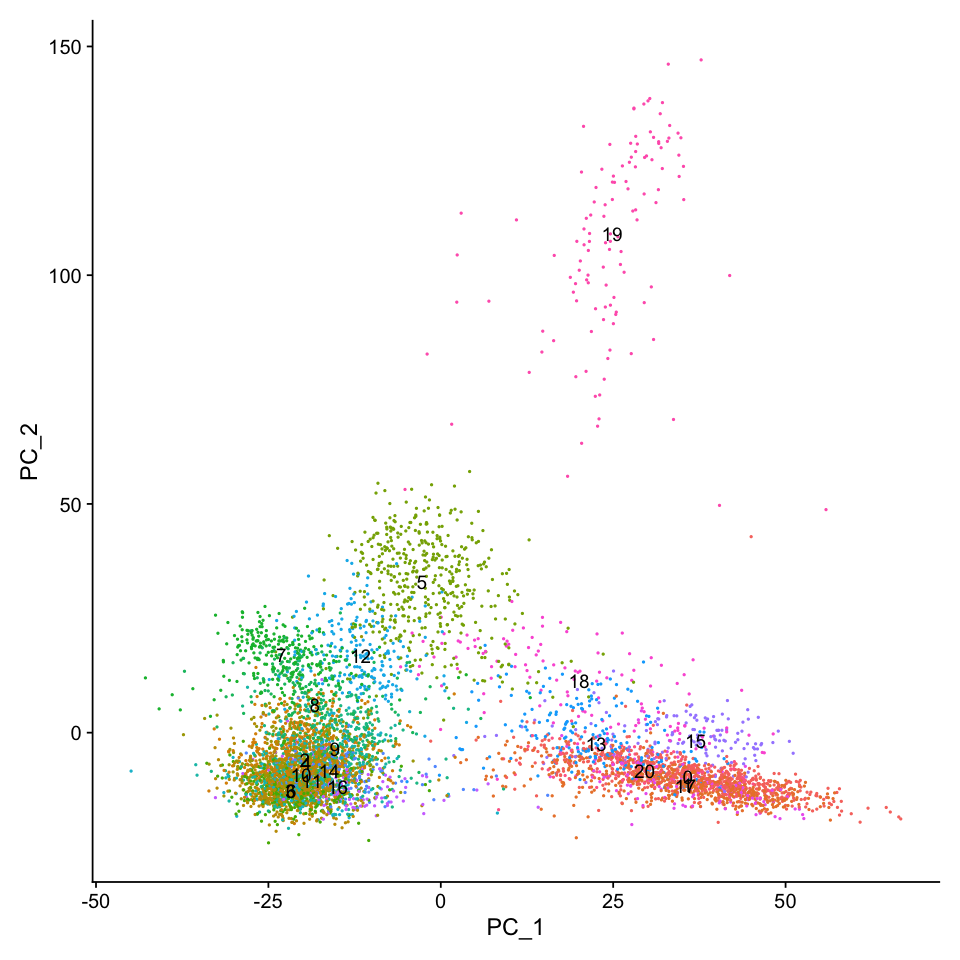

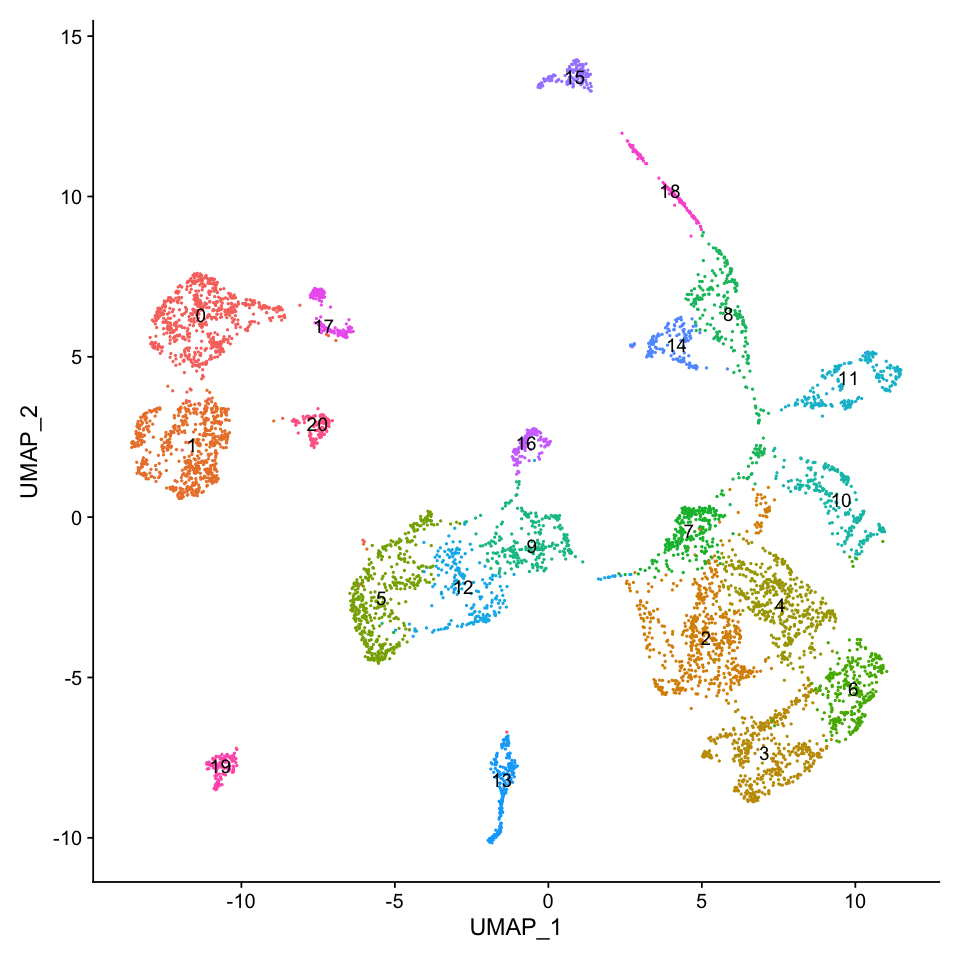

In [29]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC2 <- RunPCA(seu_HQC2, verbose = FALSE)
# seu_HQC2 <- RunTSNE(seu_HQC2, dims = 1:30, verbose = FALSE)
seu_HQC2 <- RunUMAP(seu_HQC2, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC2 <- FindNeighbors(seu_HQC2, dims = 1:30, verbose = FALSE)
seu_HQC2 <- FindClusters(seu_HQC2, verbose = FALSE)
DimPlot(seu_HQC2, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC2, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) + NoLegend()

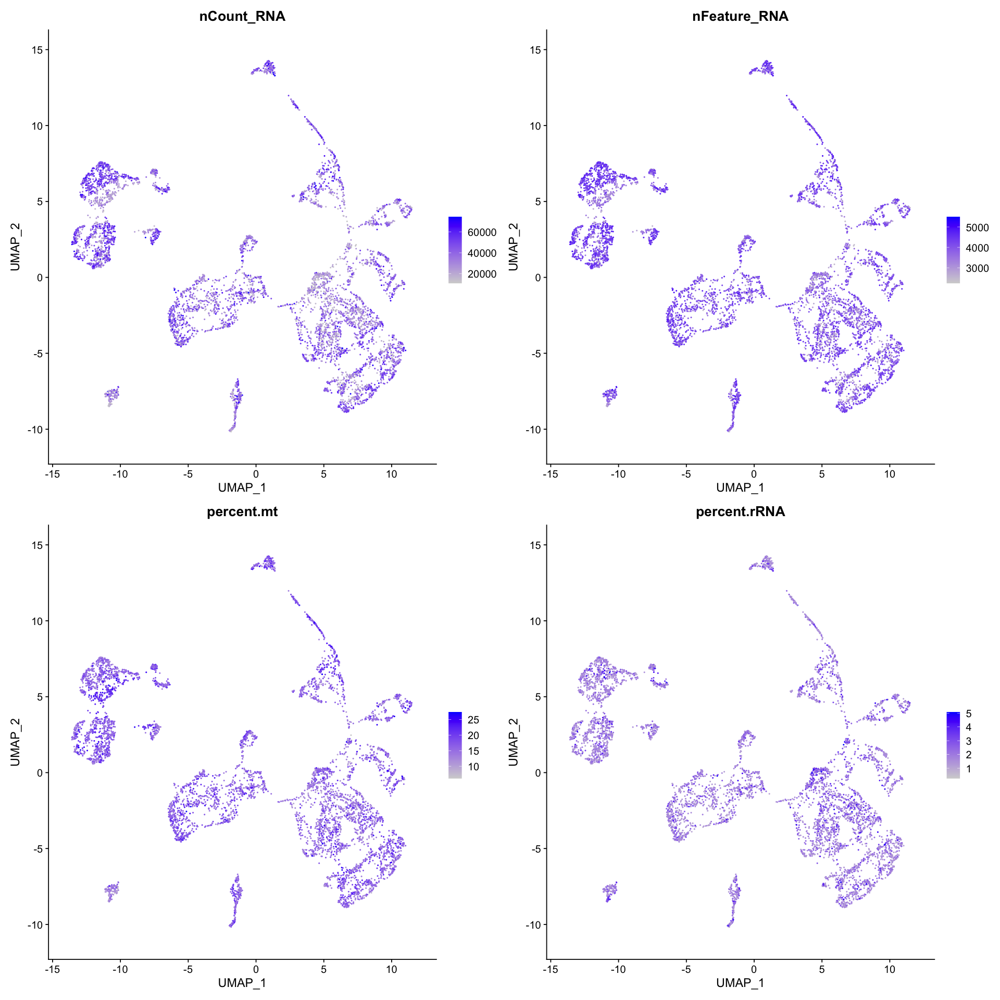

In [30]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC2, reduction = "umap", features = c("nCount_RNA", "nFeature_RNA", 
                               "percent.mt", "percent.rRNA"), pt.size = 0.2,  ncol = 2)

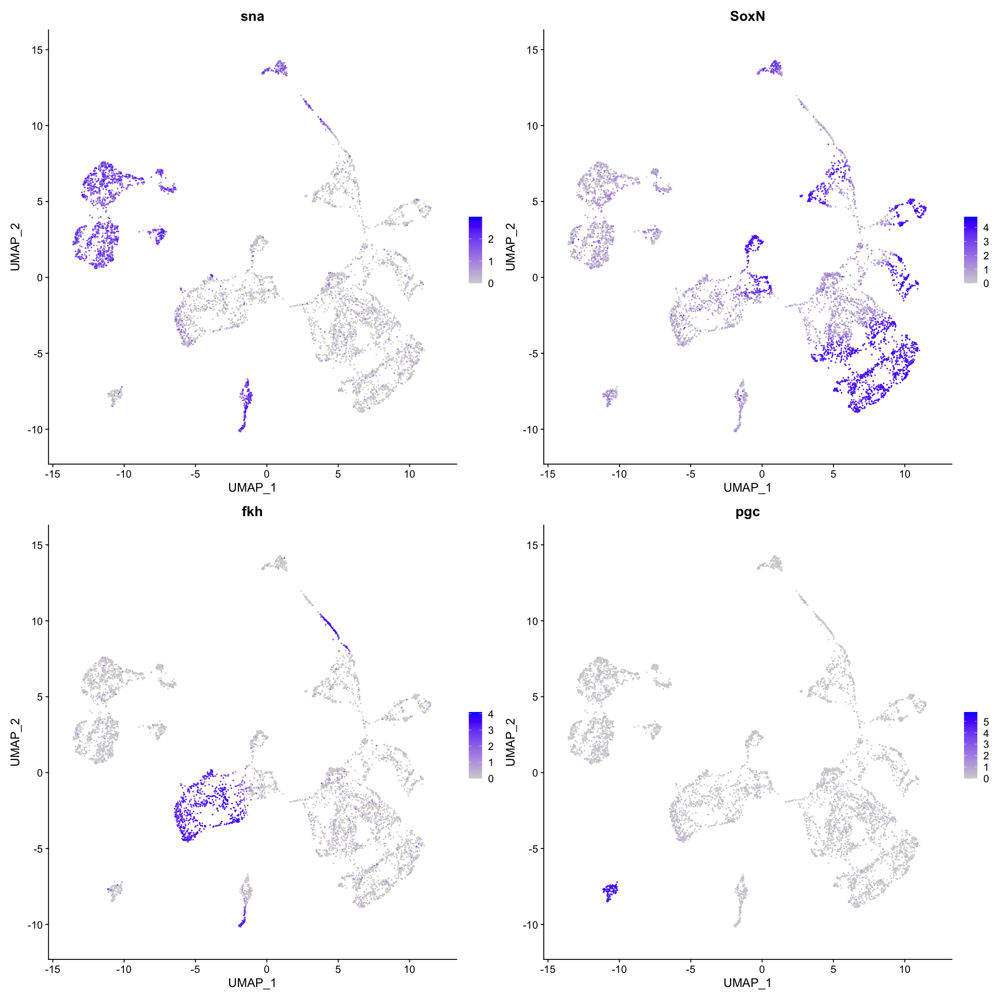

In [31]:
#Major marker genes of each germ layer
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC2, reduction = "umap", features = c("sna","SoxN", "fkh", "pgc"), pt.size = 0.2,  ncol = 2)

In [32]:
all.markers <- FindAllMarkers(object = seu_HQC2, only.pos = TRUE)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20



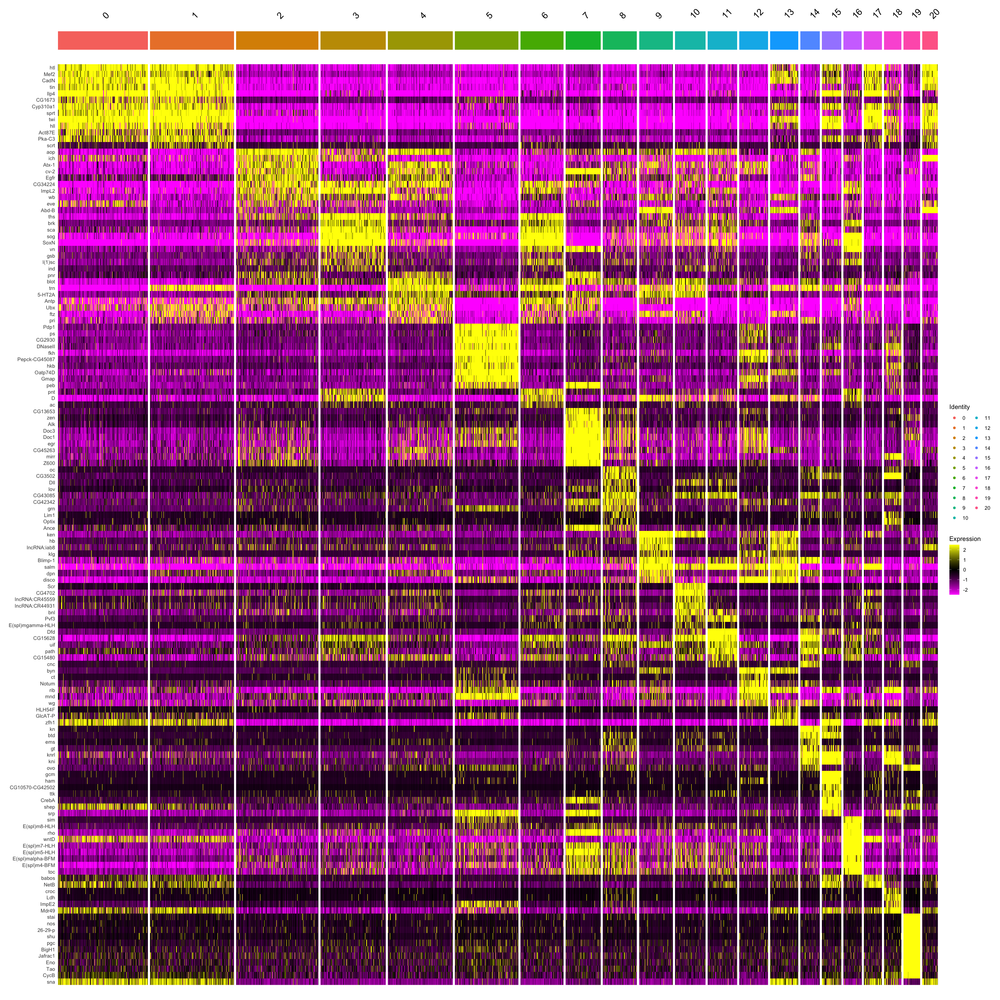

In [33]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu_HQC2, features = all.markers.top10$gene)

## Cluster annotation

In [34]:
manual_ID <- as.data.frame(seu_HQC2$seurat_clusters)
colnames(manual_ID) <- c('manual_ID')
head(manual_ID)

manual_ID$manual_ID <- dplyr::recode(manual_ID$manual_ID, 
                                        "0" = "Mesoderm_odd", #sna+, twi+, trn-
                                        "1" = "Mesoderm_even", #sna+, twi+, trn+
                                        "2" = "Dorsal_ectoderm_odd", #dpp+, trn-
                                        "3" = "Neuroectoderm_odd", #sog+, trn-
                                        "4" = "Dorsal_ectoderm_even", #dpp+, trn+
                                        "5" = "Posterior_midgut", #fkh+, hkb+
                                        "6" = "Neuroectoderm_even",#sog+, trn+
                                        "7" = "Amnioserosa", #zen
                                        "8" = "Head_ectoderm", #oc
                                        "9" = "Ectoderm_PS14", #Abd-B+, trn+
                                        "10" = "Ectoderm_PS2", #Scr+
                                        "11" = "Ectoderm_PS1", #Dfd+
                                        "12" = "Hindgut", #fkh+, byn+, ct+
                                        "13" = "Posterior_mesoderm", #sna+, twi+, Abd-B+, trn+
                                        "14" = "Ectoderm_kn", #kn+
                                        "15" = "Anterior_mesoderm", #sna+, twi+, gcm+
                                        "16" = "Midline_cells", #sim+, E(spl)-C+
                                        "17" = "Mesoderm_PS1-2", #sna+, twi+, Dfd+ or ken+
                                        "18" = "Head_mesoderm/Anterior_midgut", #sna+, fkh+, kni+
                                        "19" = "Pole_cells", #gcm+
                                        "20" = "Mesoderm_PS13", #sna, twi+, Abd-B+, trn-
                                     )
head(manual_ID)
seu_HQC2$annotated_seurat_clusters <- manual_ID

,manual_ID
,<fct>
AAACCCAAGCAACAAT,4
AAACCCAAGCGATCGA,5
AAACCCACAGGGAGAG,6
AAACCCAGTCATAGTC,8
AAACCCATCCACGGGT,20
AAACCCATCCAGTGCG,7


,manual_ID
,<fct>
AAACCCAAGCAACAAT,Dorsal_ectoderm_even
AAACCCAAGCGATCGA,Posterior_midgut
AAACCCACAGGGAGAG,Neuroectoderm_even
AAACCCAGTCATAGTC,Head_ectoderm
AAACCCATCCACGGGT,Mesoderm_PS13
AAACCCATCCAGTGCG,Amnioserosa


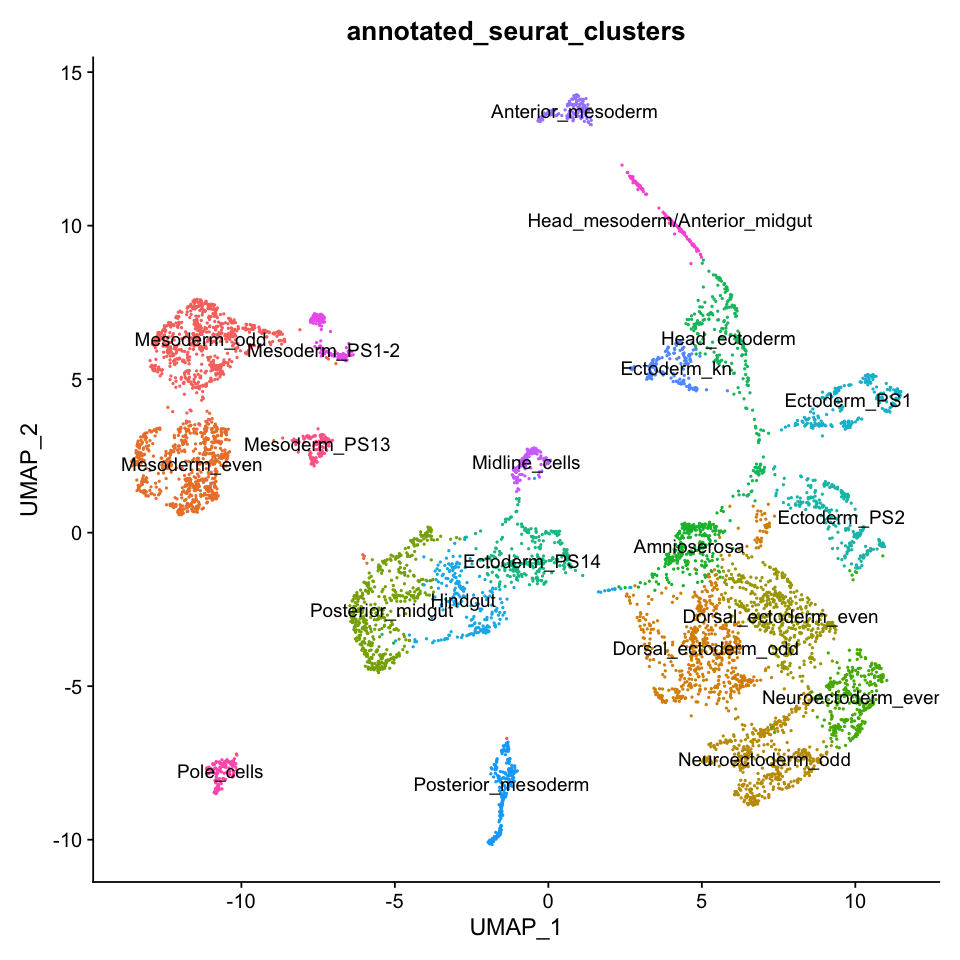

In [35]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE, group.by = 'annotated_seurat_clusters') + NoLegend()

In [36]:
write.table(manual_ID, file = "./seurat_clusters_Set3.txt")

In [37]:
saveRDS(seu_HQC2, file = "../../data/seurat_object/Set3/seu_HQC_Set3.obj")

In [38]:
write.csv(all.markers, file="./all.marker_Seurat_Clusters_number_Set3.csv",col.names=T,row.names=T,quote=F)

Warning message in write.csv(all.markers, file = "./all.marker_Seurat_Clusters_number_Set3.csv", :
“attempt to set 'col.names' ignored”


In [39]:
all.markers$cluster <- dplyr::recode(all.markers$cluster, 
                                        "0" = "Mesoderm_odd", #sna+, twi+, trn-
                                        "1" = "Mesoderm_even", #sna+, twi+, trn+
                                        "2" = "Dorsal_ectoderm_odd", #dpp+, trn-
                                        "3" = "Neuroectoderm_odd", #sog+, trn-
                                        "4" = "Dorsal_ectoderm_even", #dpp+, trn+
                                        "5" = "Posterior_midgut", #fkh+, hkb+
                                        "6" = "Neuroectoderm_even",#sog+, trn+
                                        "7" = "Amnioserosa", #zen
                                        "8" = "Head_ectoderm", #oc
                                        "9" = "Ectoderm_PS14", #Abd-B+, trn+
                                        "10" = "Ectoderm_PS2", #Scr+
                                        "11" = "Ectoderm_PS1", #Dfd+
                                        "12" = "Hindgut", #fkh+, byn+, ct+
                                        "13" = "Posterior_mesoderm", #sna+, twi+, Abd-B+, trn+
                                        "14" = "Ectoderm_kn", #kn+
                                        "15" = "Anterior_mesoderm", #sna+, twi+, gcm+
                                        "16" = "Midline_cells", #sim+, E(spl)-C+
                                        "17" = "Mesoderm_PS1-2", #sna+, twi+, Dfd+ or ken+
                                        "18" = "Head_mesoderm/Anterior_midgut", #sna+, fkh+, kni+
                                        "19" = "Pole_cells", #gcm+
                                        "20" = "Mesoderm_PS13", #sna, twi+, Abd-B+, trn-
                                     )

In [40]:
write.csv(all.markers, file="./all.marker_Seurat_Clusters_Set3.csv",col.names=T,row.names=T,quote=F)

Warning message in write.csv(all.markers, file = "./all.marker_Seurat_Clusters_Set3.csv", :
“attempt to set 'col.names' ignored”


In [41]:
levels <- read.table(file="./seurat_clusters_rename_levels_color.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)

[1] "Head_ectoderm"       "Ectoderm_kn"         "Ectoderm_PS1"       
[4] "Ectoderm_PS2"        "Amnioserosa"         "Dorsal_ectoderm_odd"

[1] 21

[1] "skyblue1"   "skyblue2"   "skyblue3"   "skyblue4"   "gray75"    
[6] "olivedrab1"

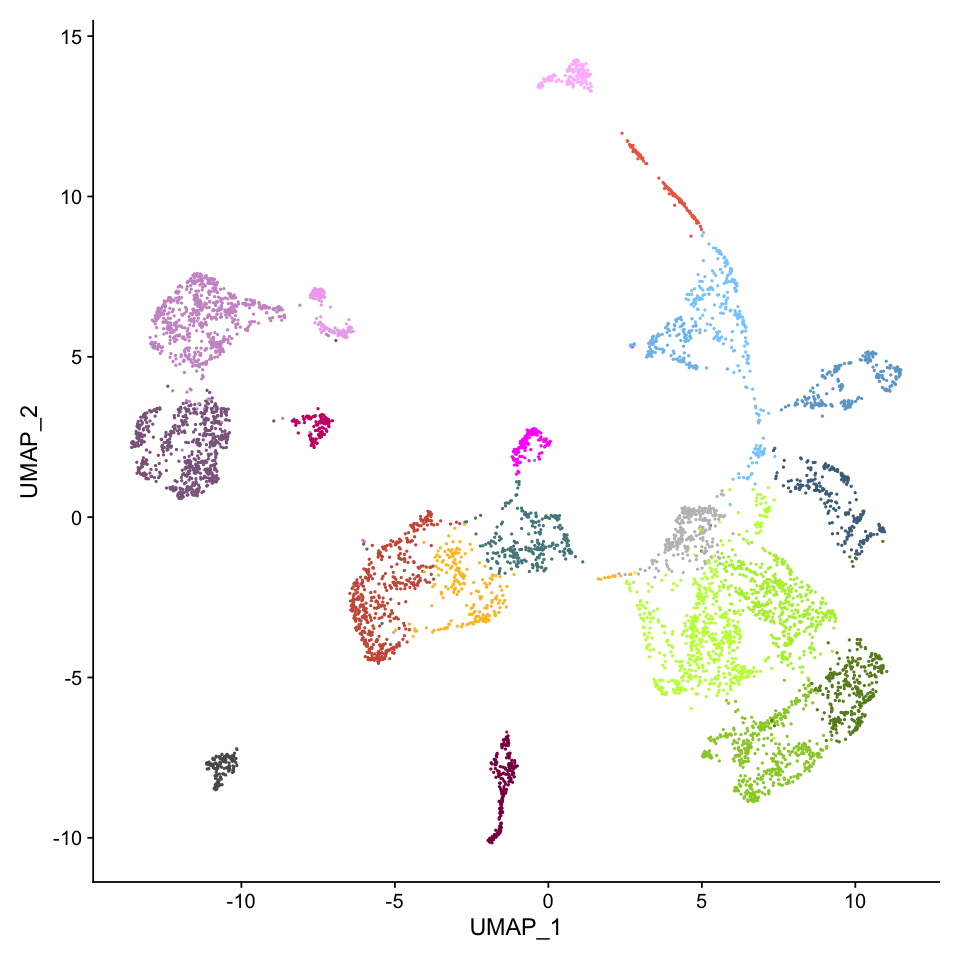

In [42]:
Idents(seu_HQC2) <- 'annotated_seurat_clusters'
levels(seu_HQC2) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC2, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/01_Seurat_clustering_Set3/all_cells_umap_seurat_clusters.eps", dpi = 300, width =8, height = 8)

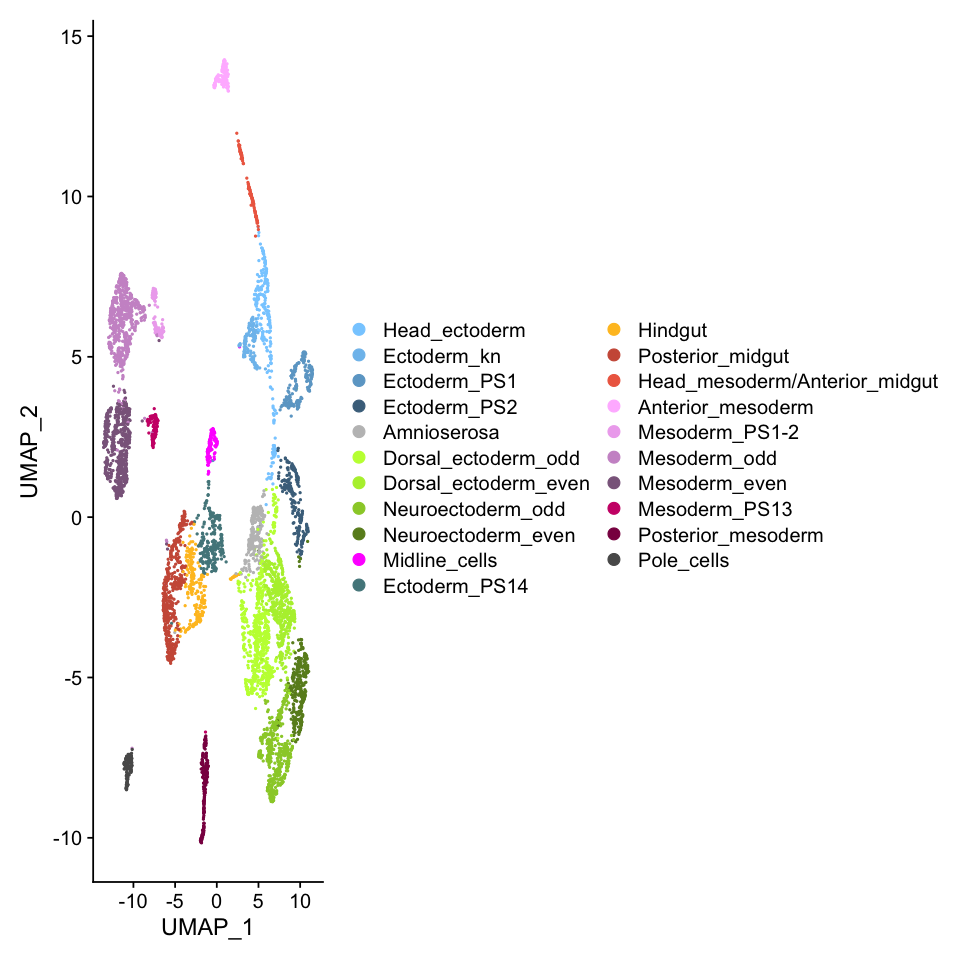

In [43]:
Idents(seu_HQC2) <- 'annotated_seurat_clusters'
levels(seu_HQC2) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC2, reduction =  "umap", label = FALSE, cols = colors)
fig
ggsave(fig, file = "./figures/01_Seurat_clustering_Set3/all_cells_umap2_seurat_clusters.eps", dpi = 300, width =20, height = 8)

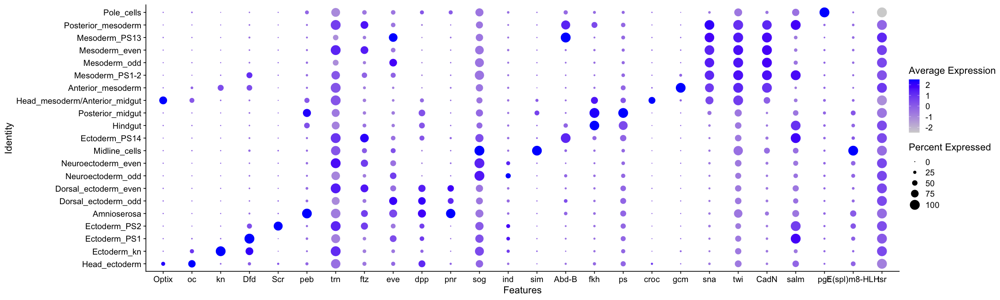

In [44]:
options(repr.plot.width=20, repr.plot.height=6)
fig <- DotPlot(object = seu_HQC2, 
        features = c("Optix", "oc", "kn", "Dfd", "Scr", "peb",
                     "trn", "ftz", "eve","dpp", "pnr", "sog", "ind", "sim", "Abd-B", 
                     "fkh", "ps", "croc", "gcm", "sna", "twi", 
                     "CadN", "salm", "pgc", "E(spl)m8-HLH", "tsr"))
fig
ggsave(fig, file = "./figures/01_Seurat_clustering_Set3/Seurat_clusters_dotplot.eps", dpi = 300,  width = 20, height = 6)

In [45]:
path = './figures/gene_expressions_on_UMAP'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","Dll","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC2, features = name) + theme(plot.title = element_blank())
    basename = paste(name, 'Set3_all_cells.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [46]:
path = './figures/gene_expressions_on_UMAP'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","Dll","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC2, features = name) + NoLegend() + theme(plot.title = element_blank())
    basename = paste(name, 'Set3_all_cells_wo_scalebar.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [47]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] dplyr_1.0.3       Matrix_1.3-2      Seurat_3.2.3      data.table_1.13.6
[5] magrittr_2.0.1    ggplot2_3.3.3    

loaded via a namespace (and not attached):
  [1] nlme_3.1-151          matrixStats_0.57.0    RcppAnnoy_0.0.18     
  [4] RColorBrewer_1.1-2    httr_1.4.2            repr_1.1.0           
  [7] sctransform_0.3.2     tools_4.0.3           R6_2.5.1             
 [10] irlba_2.3.3           rpart_4.1-15          KernSmooth_2.23-18   
 [13] uwot_0.1.10           mgcv_1.8-33           